# Kings County Housing Prices Bakeoff

Below are a list of steps that you should take while trying to complete your bake-off entry.

In [1]:
import pandas as pd
import numpy as np
import math
from math import sin, cos, sqrt, atan2
from matplotlib import pyplot as plt
import numpy as np
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import SelectKBest, f_regression,mutual_info_regression
from sklearn.feature_selection import RFECV
import warnings
import seaborn as sns
from sklearn.preprocessing import StandardScaler
plt.style.use('seaborn')

warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 100)

## Step 1: Read in Data

In [2]:
#reading training Data
df=pd.read_csv('kc_house_data_train.csv',index_col=0)

df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2591820310,20141006T000000,365000.0,4,2.25,2070,8893,2.0,0,0,4,8,2070,0,1986,0,98058,47.4388,-122.162,2390,7700
1,7974200820,20140821T000000,865000.0,5,3.00,2900,6730,1.0,0,0,5,8,1830,1070,1977,0,98115,47.6784,-122.285,2370,6283
2,7701450110,20140815T000000,1038000.0,4,2.50,3770,10893,2.0,0,2,3,11,3770,0,1997,0,98006,47.5646,-122.129,3710,9685
3,9522300010,20150331T000000,1490000.0,3,3.50,4560,14608,2.0,0,2,3,12,4560,0,1990,0,98034,47.6995,-122.228,4050,14226
4,9510861140,20140714T000000,711000.0,3,2.50,2550,5376,2.0,0,0,3,9,2550,0,2004,0,98052,47.6647,-122.083,2250,4050


## Step 2: Exploratory Data Analysis 
    
Become familiar with the data.  Look to see if there are any extreme values.  

Additionally create data visualizations to determine if there are any relationships between your features and your target variables.  

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17290 entries, 0 to 17289
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             17290 non-null  int64  
 1   date           17290 non-null  object 
 2   price          17290 non-null  float64
 3   bedrooms       17290 non-null  int64  
 4   bathrooms      17290 non-null  float64
 5   sqft_living    17290 non-null  int64  
 6   sqft_lot       17290 non-null  int64  
 7   floors         17290 non-null  float64
 8   waterfront     17290 non-null  int64  
 9   view           17290 non-null  int64  
 10  condition      17290 non-null  int64  
 11  grade          17290 non-null  int64  
 12  sqft_above     17290 non-null  int64  
 13  sqft_basement  17290 non-null  int64  
 14  yr_built       17290 non-null  int64  
 15  yr_renovated   17290 non-null  int64  
 16  zipcode        17290 non-null  int64  
 17  lat            17290 non-null  float64
 18  long  

In [4]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,1.729000e+04,1.729000e+04,17290.000000,17290.000000,17290.000000,1.729000e+04,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000,17290.000000
mean,4.565502e+09,5.407395e+05,3.372470,2.111943,2081.464604,1.524340e+04,1.490312,0.007981,0.238519,3.408502,7.654425,1789.306015,292.158589,1970.792019,83.806304,98078.193175,47.560058,-122.214258,1987.986698,12873.475824
std,2.874656e+09,3.733190e+05,0.939346,0.770476,920.018539,4.230462e+04,0.538909,0.088985,0.775229,0.651296,1.174718,829.265107,443.151874,29.343516,400.329376,53.607949,0.138412,0.140857,684.802635,27227.437583
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.720000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,659.000000
25%,2.114701e+09,3.210000e+05,3.000000,1.500000,1430.000000,5.081250e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1951.000000,0.000000,98033.000000,47.471200,-122.329000,1490.000000,5111.250000
50%,3.903650e+09,4.500000e+05,3.000000,2.250000,1920.000000,7.642000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1974.000000,0.000000,98065.000000,47.571600,-122.230000,1840.000000,7622.500000
75%,7.301150e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.072575e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2214.500000,560.000000,1996.000000,0.000000,98118.000000,47.677900,-122.126000,2360.000000,10101.750000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,858132.000000


## Step 3: Clean up any issues (extreme values, etc.) with the data.  

Remember that you can't just delete rows with extreme values. Similar observations might be present in the holdout data set, and you can't just delete those rows and not have a prediction for it. 

In [5]:
#modifying Date fo make it more readable 
df['year'] = df['date'].apply(lambda x: int(x[0:4]))
df['month'] = df['date'].apply(lambda x: int(x[4:6]))

df['date'] = df['date'].apply(lambda x: x.strip('T000000'))
df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')

#fixing outliers on bedrooms
df[df.bedrooms>7].bedrooms=df.bedrooms.median()
df[df.bathrooms>5].bathrooms=df.bathrooms.median()

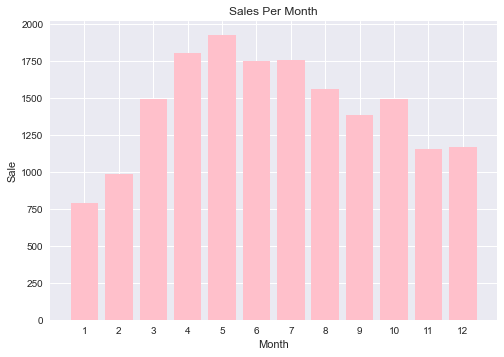

In [6]:
y=df.month.value_counts().values
x=df.month.value_counts().index
plt.bar(x,y,color="pink")
plt.xticks(x)
plt.title('Sales Per Month')
plt.xlabel('Month')
plt.ylabel('Sale')
plt.show()

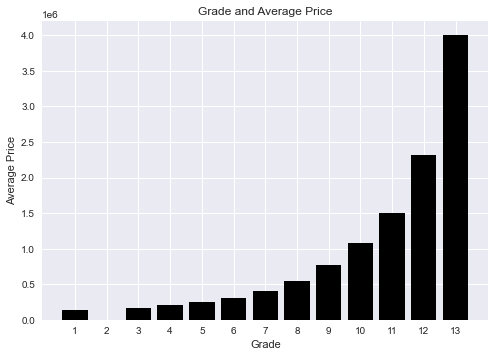

In [7]:
x=list(df[['grade','price']].groupby('grade').mean().index)
y=list(df[['grade','price']].groupby('grade').mean().price.values)
plt.bar(x,y,color="black")
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13])
plt.title('Grade and Average Price')
plt.xlabel('Grade')
plt.ylabel('Average Price')
plt.show()


## Step 4: Generate new features that you think could be important.

After doing this, you will want to go back to steps 2 and 3 to investigate these new features.

In [8]:
#creating a visualization of all the properties that where sold and their location.
import folium
seatle_map = folium.Map(location=[47.60646230355264, -122.33451886696908], zoom_start=11)
marker = folium.CircleMarker(location = [47.60646230355264, -122.33451886696908], radius=10)
marker.add_to(seatle_map)
latandlon = list(zip(list(df['lat']),list(df['long'])))
for i,v in latandlon:
    marker = folium.CircleMarker(location = [i, v], radius=1)
    marker.add_to(seatle_map)

In [9]:
seatle_map

In [10]:
df['coordinates'] = list(zip(df.lat, df.long))
df=df.drop(['lat','long'],axis=1)

In [11]:
#generated a feature that calculates the distance from city center to add more context to our location columns.
from geopy.distance import geodesic
seattle = (47.60646230355264, -122.33451886696908)
df['dis_from_city']=df['coordinates'].apply(lambda x: round(geodesic(seattle, x ).miles,2))
df.drop(["coordinates"],axis=1,inplace=True)

In [12]:
#binned grade to organize the rating of a house and separated into dummies in reference of how high it was scored.
df.grade=pd.cut(df.grade,bins=3,labels=[1,2,3])


In [13]:
#creating bins for the year it was built.
for x in range(len(df.yr_built)):
    df.yr_built[x]=(math.floor(df.yr_built[x]/10))*10

In [14]:
#used zipcode to create a column that knows if a zipcode is an expensive neighborhood or not.
high_income_zip=[98072, 98065, 98052, 98005, 8177, 98121, 98199, 98110, 98006, 98053, 98101, 98033, 98077, 98074, 98075, 98112, 98164, 98004, 98040, 98039]
df['high_income_zip']=0
for x in range(len(df.zipcode)):
    if df.zipcode[x] in high_income_zip:
        df.high_income_zip[x]=1
    else:
        df.high_income_zip[x]=0


### 4.1) Identify a categorical variable in the data set and create dummy columns.

In [15]:
#decided to create dummies for grade and condition to better expalin their categorical values
dummies = pd.get_dummies(df['grade'],prefix='grade')
dummies[list(dummies.columns)[:2]]
df=pd.concat([df, dummies[list(dummies.columns)[:2]]], axis=1, sort=False)
df=df.drop('grade',axis=1)

df = pd.concat([df, pd.get_dummies(df['condition'],drop_first = True,prefix = 'condition')], 1)


### 4.2) There is a column that gives the date for when the house was sold, how could this be useful in your model? How might you transform the current column to a more useful feature?

In [16]:
#created a binary variable that veryfies if a property has been resold or not. 
resold=df.id.value_counts(sort=True).to_frame()
res=list(df[df.id.isin(list(resold[resold.id>1].index))].index)
df['resold']=0
for x in res:
    df.resold[x]=1


### 4.3) There are columns for when the house was built and when it was renovated.  How could you use these columns to create a new column?

In [17]:
#created a column that shows the age of a house since it was renovated.
conditions=[
    df.yr_renovated==0,
    df.yr_renovated!=0,
]
choises=[
    2020-df.yr_built,
    (2020 - df['yr_renovated']) 
]
df['age']=np.select(conditions,choises)

### <ins>Non-linear transformations</ins>

### 4.4) Create a polynomial feature for two of your continuous variables.

In [18]:
#creating polinomials to try to make a more linear relation for the features.
df['sqft_lot15_log'] = np.log(df['sqft_lot15'])
df['dis_from_city_log'] = np.log(df['dis_from_city'])
df['sqft_basement^2'] = df['sqft_basement']**2

### 4.5) Create an interaction feature between a binary variable (dummy variable) and a continuous variable.

In [19]:
#creating interactions with features that I think have relevance with eachother.
df['sqft_living_waterfront'] = df['sqft_living']*df['waterfront']
df['sqft_lot_high_income_zip'] = df['sqft_lot']*df['high_income_zip']
df['sqft_above_waterfront'] = df['sqft_above']*df['floors']
df['yr_built_sqrft_living'] = df['yr_built']*df['sqft_living']

## Step 5: Train-Test Split

If you plan on doing any scaling of your data, make sure it is done at the appropriate time. 

In [20]:
# %matplotlib inline
# import matplotlib.pyplot as plt
# df.hist(bins=50, figsize=(20,15))
# plt.show()

In [21]:
#I used a Histogram plot to see the distribution of my features and see how can they be transformed.

In [22]:
features = [str(x) for x in list(df.columns)[2:]]

In [23]:
# plt.figure(figsize=(25, 10))
# sns.heatmap(df.corr(), cmap='bwr', center=0, annot=True)

In [24]:
#Using our heat map we can see all our coeficients. The once that stand out in the chart seem to be SQFT_ABOVE 
#SQFT_LVING and SQRFT_LIVING15 in relation to YR_BUILT_SQRFT_LIVING. But well have to wait till our feature selection
#to decide which features to remove and which to keep.

In [25]:
n = 4
row_groups= [features[i:i+n] for i in range(0, len(features), n) ]

In [26]:
# import seaborn as sns
# for i in row_groups:
#     pp = sns.pairplot(data=df, y_vars=['price'],x_vars=i, kind="reg", height=3)

In [27]:
#After creating our pairplots for our features were able to see a lot of linear relationships as well as categorical
#relationships. Specially the onse who have been Log and ^2 transformed. 

### 5.1) Perform a train-test split of the data.

In [28]:
df.drop(['date'],axis=1,inplace=True)

In [29]:
y=df.price 
x=df[list(df.columns[(df.columns!="price")])]

In [30]:
X_train, X_test, y_train, y_test = train_test_split(x, y, random_state=2020,test_size=0.2)
print("Training set - Features: ", X_train.shape, "Target: ", y_train.shape)
print("Training set - Features: ", X_test.shape, "Target: ",y_test.shape)

Training set - Features:  (13832, 35) Target:  (13832,)
Training set - Features:  (3458, 35) Target:  (3458,)


In [31]:
#Creating our train test splits 80/20

### 5.2) Fit your scaler to training the data.

In [32]:
# Instantiate the Standar Scaler Object.
ss = StandardScaler()

# Fit and Transform the training data.
X_train_transformed = ss.fit_transform(X_train)


### 5.3) Transform the testing set with the scaler.

In [33]:
X_test_transformed = ss.transform(X_test)

### 5.4) Fit the model to the training data.

In [34]:
#creating the string for our OLS model.
features = [str(x) for x in list(df.columns)[2:]]
featurelist='+'.join(features)
featurelist

'bedrooms+bathrooms+sqft_living+sqft_lot+floors+waterfront+view+condition+sqft_above+sqft_basement+yr_built+yr_renovated+zipcode+sqft_living15+sqft_lot15+year+month+dis_from_city+high_income_zip+grade_1+grade_2+condition_2+condition_3+condition_4+condition_5+resold+age+sqft_lot15_log+dis_from_city_log+sqft_basement^2+sqft_living_waterfront+sqft_lot_high_income_zip+sqft_above_waterfront+yr_built_sqrft_living'

In [35]:
#Creating an OLS model to get an idea of our R squared value, also to view our P vaues and coeficients. 
line = ols(data=df,formula= 'price~bedrooms+bathrooms+sqft_living+sqft_lot+floors+waterfront+view+condition+sqft_above+sqft_basement+yr_built+yr_renovated+zipcode+sqft_living15+sqft_lot15+year+month+dis_from_city+high_income_zip+grade_1+grade_2+condition_2+condition_3+condition_4+condition_5+resold+age+sqft_lot15_log+dis_from_city_log+sqft_basement^2+sqft_living_waterfront+sqft_lot_high_income_zip+sqft_above_waterfront').fit()
line.summary()           
           

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.764
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     1807.
Date:                Fri, 23 Oct 2020   Prob (F-statistic):               0.00
Time:                        10:54:31   Log-Likelihood:            -2.3387e+05
No. Observations:               17290   AIC:                         4.678e+05
Df Residuals:                   17258   BIC:                         4.680e+05
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                 8.137e+06    9.8e+06      0.830      0.406   -1.11e+07    2.73e+07
bedrooms                 -2.507e+04   1898.361    -13.206      0.000   -2.88e+04   -2.13e+04
bathrooms                 3.985e+04   3310.354     12.037      0.000    3.34e+04    4.63e+04
sqft_living              -1014.6892    358.698     -2.829      0.005   -1717.773    -311.605
sqft_lot                     0.2228      0.047      4.694      0.000       0.130       0.316
floors                   -6.698e+04   8011.950     -8.360      0.000   -8.27e+04   -5.13e+04
waterfront               -5.013e+05   3.57e+04    -14.062      0.000   -5.71e+05   -4.31e+05
view                      5.882e+04   2139.157     27.498      0.000    5.46e+04     6.3e+04
condition                 3.097e+05   3.16e+05      0.979      0.328    -3.1e+05     9.3e+05
sqft_above                1164.0225    358.377      3.248      0.001     461.566    1866.479
sqft_basement            -2178.6852    717.023     -3.039      0.002   -3584.124    -773.247
yr_built                 -1035.7707    290.279     -3.568      0.000   -1604.747    -466.794
yr_renovated                19.9716      9.443      2.115      0.034       1.462      38.481
zipcode                   -784.1300     32.414    -24.191      0.000    -847.664    -720.596
sqft_living15               35.0492      3.505     10.000      0.000      28.179      41.919
sqft_lot15                  -0.0774      0.092     -0.843      0.399      -0.257       0.103
year                      3.528e+04   4748.715      7.430      0.000     2.6e+04    4.46e+04
month                     1209.1024    710.920      1.701      0.089    -184.372    2602.577
dis_from_city            -2344.4356    608.778     -3.851      0.000   -3537.702   -1151.170
high_income_zip           1.377e+05   4081.676     33.742      0.000     1.3e+05    1.46e+05
grade_1                  -1.891e+05   1.47e+04    -12.832      0.000   -2.18e+05    -1.6e+05
grade_2                  -1.954e+05   6767.703    -28.869      0.000   -2.09e+05   -1.82e+05
condition_2              -2.358e+05   3.17e+05     -0.744      0.457   -8.57e+05    3.86e+05
condition_3              -5.082e+05   6.32e+05     -0.804      0.421   -1.75e+06    7.31e+05
condition_4              -7.885e+05   9.48e+05     -0.831      0.406   -2.65e+06    1.07e+06
condition_5              -1.052e+06   1.26e+06     -0.832      0.405   -3.53e+06    1.43e+06
resold                   -1.592e+04   1.21e+04     -1.311      0.190   -3.97e+04    7876.950
age                       -477.7890    292.796     -1.632      0.103   -1051.700      96.122
sqft_lot15_log            1.098e+04   3463.579      3.170      0.002    4190.860    1.78e+04
dis_from_city_log        -2.015e+05   6546.282    -30.775      0.000   -2.14e+05   -1.89e+05
sqft_basement 

In [36]:
# We scored a good R2 and our P values are lower than our alpha so it shows that we have good features.

### 5.5) Use the model to predict on the training set and the test set.

In [37]:
# instantiating the Linear Regression Model for our predictions.
lm= LinearRegression()

lm = lm.fit(X_train, y_train)

y_train_pred = lm.predict(X_train)

train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))

### 5.6) Evaluate the training and test predictions using RMSE.

In [38]:
#Creating our RMSE's for our test and training data
from sklearn.metrics import mean_squared_error
y_pred = lm.predict(X_test)

test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))

print('Training Root Mean Squared Error:' , train_rmse)

print('Testing Root Mean Squared Error:' , test_rmse)


Training Root Mean Squared Error: 180417.22629889738
Testing Root Mean Squared Error: 177708.59865619667


In [39]:
lm

LinearRegression()

### 5.7) Determine if your model is overfit.

In [40]:
#The model is not overfit. Our Training RMSE is higher than our Test meaning the model is not overfit.

## Step 6: Utilize some different feature selection techniques before or in conjuction with fitting your models.

### 6.1) Utilize a filter method to identify some features to remove from the model.  

KbestF

In [41]:
from sklearn.feature_selection import SelectKBest, f_regression,mutual_info_regression

selector = SelectKBest(f_regression, k=15)

selector.fit(X_train, y_train)

SelectKBest(k=15, score_func=<function f_regression at 0x7fbbdf2f50e0>)

In [42]:
selected_columns = X_train.columns[selector.get_support()]
removed_columns = X_train.columns[~selector.get_support()]

In [43]:
#Creating our Linear regression model with our K Best Features using F Regression 
lm_kbest = LinearRegression()


lm_kbest = lm_kbest.fit(X_train[selected_columns], y_train)

y_train_kbest = lm_kbest.predict(X_train[selected_columns])


trainK_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_kbest))


print('Training Root Mean Squared Error:' , trainK_rmse)

y_kbest = lm_kbest.predict(X_test[selected_columns])

testK_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_kbest))

print('Testing Root Mean Squared Error:' , testK_rmse)



Training Root Mean Squared Error: 188187.27813582472
Testing Root Mean Squared Error: 185652.42549843862


In [44]:
#Our Kbest with F Regression performed well but not so great. The coeficients are higher than our original model.

KbestMIF

In [45]:
selector_mif = SelectKBest(mutual_info_regression, k=20)

selector_mif.fit(X_train, y_train)

SelectKBest(k=20,
            score_func=<function mutual_info_regression at 0x7fbbdf3ac8c0>)

In [46]:
selected_columns_mif = X_train.columns[selector_mif.get_support()]
removed_columns_mif = X_train.columns[~selector_mif.get_support()]

In [47]:
#creating Linear Regression Model with our K Best using Mutial Info Regression as our selector. 
lm_kbest_mif = LinearRegression()


lm_kbest_mif = lm_kbest.fit(X_train[selected_columns_mif], y_train)

y_train_kbest_mif = lm_kbest_mif.predict(X_train[selected_columns_mif])


trainK_rmse_mif = np.sqrt(metrics.mean_squared_error(y_train, y_train_kbest_mif))


print('Training Root Mean Squared Error:' , trainK_rmse_mif)

y_kbest_mif = lm_kbest_mif.predict(X_test[selected_columns_mif])

testK_rmse_mif = np.sqrt(metrics.mean_squared_error(y_test, y_kbest_mif))

print('Testing Root Mean Squared Error:' , testK_rmse_mif)


Training Root Mean Squared Error: 194415.73374740971
Testing Root Mean Squared Error: 195654.38582626282


In [48]:
#This model is slightley overfit, and it has high RMSE so its not very usefull

REV

In [49]:
from sklearn.feature_selection import RFECV

In [50]:
ols = linear_model.LinearRegression()

In [51]:
# Create recursive feature eliminator features for our model.
selector = RFECV(estimator=ols, step=1, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

selector.fit(X_train, y_train)

selected_rfe = X_train.columns[selector.support_]
removed_rfe = X_train.columns[~selector.support_]


In [52]:
#creating Linear Regression for REV model.
lm_rfe = LinearRegression()


lm_rfe = lm_rfe.fit(X_train[selected_rfe], y_train)

y_rfe = lm_rfe.predict(X_train[selected_rfe])


trainRFE_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_rfe))


print('Training Root Mean Squared Error:' , trainRFE_rmse)

y_pred_rfe = lm_rfe.predict(X_test[selected_rfe])

testRFE_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred_rfe))

print('Testing Root Mean Squared Error:' , testRFE_rmse)




Training Root Mean Squared Error: 180755.07724371424
Testing Root Mean Squared Error: 178794.7438622886


In [53]:
# The models RMSE's perfomed really well but not as well as our original model

Lasso

In [54]:
from sklearn.linear_model import Lasso
#Creating our lasso model to create our predictions.

lasso = Lasso(alpha=0.1, normalize=False)

lasso.fit(X_train,y_train)

y_train_lasso01 = lasso.predict(X_train)
y_test_lasso01 = lasso.predict(X_test)

train_rmse_lasso01 = metrics.mean_absolute_error(y_train, y_train_lasso01)
test_rmse_lasso01 = np.sqrt(metrics.mean_squared_error(y_test,y_test_lasso01))
print('Training Error: '+ str(train_rmse_lasso01) )
print('Testing Error: '+ str(test_rmse_lasso01) )



Training Error: 113078.77439678342
Testing Error: 178282.8760186504


In [55]:
#This model is completely overfit therefore we have no use for it.

### 6.2) After removing the features, re-run Step 5 and see if your new model performs better than the old model.

## Step 7: Evaluate your different models in order to determine the best model overall.

In [56]:
print('Original: \t', test_rmse, '\n',
      "KBest: \t", testK_rmse, '\n',
      "KBest MIF: \t", testK_rmse_mif, '\n',
      "RFE: \t \t", testRFE_rmse, '\n', 
      "Lasso 0.01: \t",  test_rmse_lasso01, '\n')

Original: 	 177708.59865619667 
 KBest: 	 185652.42549843862 
 KBest MIF: 	 195654.38582626282 
 RFE: 	 	 178794.7438622886 
 Lasso 0.01: 	 178282.8760186504 



## Step 8:  Refit your best model to the entire dataset.

In [57]:
#fitting the model to the entrie dataset. 

In [58]:
x=df[list(x.columns)]

In [59]:
y=df['price']

In [60]:
scaler = StandardScaler()

df=pd.DataFrame(data=scaler.fit_transform(x),columns=x.columns)

In [61]:
#instantiate a linear regression object
lm_final = LinearRegression()

#fit the linear regression to the data
lm_final = lm_final.fit(df, y)

In [62]:
df.describe()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,year,month,dis_from_city,high_income_zip,grade_1,grade_2,condition_2,condition_3,condition_4,condition_5,resold,age,sqft_lot15_log,dis_from_city_log,sqft_basement^2,sqft_living_waterfront,sqft_lot_high_income_zip,sqft_above_waterfront,yr_built_sqrft_living
count,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04,1.729000e+04
mean,-2.886965e-17,6.934881e-18,6.904059e-17,-6.708855e-17,2.260257e-18,7.212276e-17,-2.465735e-18,-3.328743e-17,-1.080814e-16,-1.136293e-16,-4.695171e-17,-3.116587e-16,-2.794500e-17,5.244146e-14,4.376680e-17,-6.575294e-18,-1.552314e-13,9.862941e-18,-1.679782e-16,-6.452007e-17,6.575294e-18,-9.883489e-17,5.054757e-17,7.890353e-17,2.157518e-17,-2.630118e-17,-3.369838e-17,-1.027390e-18,-1.562454e-15,-1.706237e-16,5.136949e-17,1.027390e-17,-1.335607e-18,-8.095831e-17,-2.794500e-17
std,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00,1.000029e+00
min,-1.587889e+00,-3.590337e+00,-2.741167e+00,-1.947261e+00,-3.468137e-01,-9.098498e-01,-8.969788e-02,-3.076849e-01,-3.698124e+00,-1.808046e+00,-6.592932e-01,-2.249073e+00,-2.093494e-01,-1.439999e+00,-2.320424e+00,-4.486221e-01,-6.909406e-01,-1.787207e+00,-1.627851e+00,-5.430811e-01,-1.127392e-01,-3.230354e+00,-9.002491e-02,-1.363724e+00,-5.945844e-01,-2.930028e-01,-1.155986e-01,-1.596436e+00,-3.049445e+00,-3.905138e+00,-4.351923e-01,-8.001072e-02,-2.285689e-01,-1.243060e+00,-1.926168e+00
25%,-8.525794e-01,-3.965318e-01,-7.942633e-01,-7.081199e-01,-2.402206e-01,-9.098498e-01,-8.969788e-02,-3.076849e-01,-6.272326e-01,-7.106570e-01,-6.592932e-01,-5.476304e-01,-2.093494e-01,-8.430556e-01,-7.272184e-01,-2.850966e-01,-6.909406e-01,-8.247149e-01,-8.147699e-01,-5.430811e-01,-1.127392e-01,3.095636e-01,-9.002491e-02,-1.363724e+00,-5.945844e-01,-2.930028e-01,-1.155986e-01,-7.355609e-01,-5.274934e-01,-6.738605e-01,-4.351923e-01,-8.001072e-02,-2.285689e-01,-7.815753e-01,-7.089918e-01
50%,-2.302435e-01,-3.965318e-01,1.791887e-01,-1.755065e-01,-1.796877e-01,1.797698e-02,-8.969788e-02,-3.076849e-01,-6.272326e-01,-2.765251e-01,-6.592932e-01,1.329468e-01,-2.093494e-01,-2.461119e-01,-2.161075e-01,-1.928616e-01,-6.909406e-01,-1.830535e-01,-1.766744e-01,-5.430811e-01,-1.127392e-01,3.095636e-01,-9.002491e-02,7.332864e-01,-5.945844e-01,-2.930028e-01,-1.155986e-01,-4.686069e-02,-3.545721e-02,1.246222e-01,-4.351923e-01,-8.001072e-02,-2.285689e-01,-4.199994e-01,-1.840189e-01
75%,9.516714e-01,6.680699e-01,5.036727e-01,5.092821e-01,-1.067916e-01,9.458037e-01,-8.969788e-02,-3.076849e-01,9.082130e-01,5.127507e-01,6.044184e-01,8.135239e-01,-2.093494e-01,7.425760e-01,5.432573e-01,-1.018019e-01,1.447302e+00,7.794386e-01,6.409326e-01,-5.430811e-01,-1.127392e-01,3.095636e-01,-9.002491e-02,7.332864e-01,1.681847e+00,-2.930028e-01,-1.155986e-01,6.418395e-01,3.112359e-01,7.645987e-01,4.923198e-02,-8.001072e-02,-2.285689e-01,6.552132e-01,5.010959e-01
max,1.855754e+00,3.154152e+01,7.642321e+00,1.245504e+01,3.867575e+01,3.729284e+00,1.114854e+01,4.852229e+00,2.443659e+00,9.189961e+00,1.021765e+01,1.494101e+00,4.824151e+00,2.253590e+00,6.165478e+00,3.104526e+01,1.447302e+00,1.741931e+00,

## Step 9: Save your final model using pickle.

https://machinelearningmastery.com/save-load-machine-learning-models-python-scikit-learn/

In [63]:
import pickle


pickle_out = open("model.pickle","wb")
pickle.dump(lm_final, pickle_out)
pickle_out.close()

pickle_out=open('scaler.pickle','wb')
pickle.dump(scaler, pickle_out)
pickle_out.close()

In [64]:
lm_final.predict(x)

array([-1.24098852e+13, -2.72670207e+13, -2.94928457e+13, ...,
       -1.19827825e+13, -6.17720539e+12, -1.94626821e+13])

In [65]:
f

NameError: name 'f' is not defined